# Лабораторная работа 4: Max-Cut
Вариант: 22

Выполнил: Проскуряков Роман Владимирович

In [1]:
import numpy as np
import time
import matplotlib.pyplot as plt
from typing import List, Tuple, Dict
import random
from collections import defaultdict
import seaborn as sns

In [2]:
# ====================
# 1. ЗАГРУЗКА ДАННЫХ ГРАФА
# ====================

def load_weight_matrix():
    """Загружает матрицу весов из задания"""
    weight_matrix_str = """0 8  5 0 0 0 0 0  0  0 8 0 0  0 0  4 0 9 0  0
8 0  6 0 0 0 0 0  0  0 0 0 0  0 0  0 0 0 0  0
5 6  0 9 9 7 0 9 10  0 3 0 0  0 0  0 0 0 0  3
0 0  9 0 0 0 0 6  7  0 9 0 1  0 5  0 2 3 0  0
0 0  9 0 0 5 0 0  6  7 7 0 0  0 0  0 9 6 0  0
0 0  7 0 5 0 0 0  0  0 0 0 0  1 0  1 0 5 0  0
0 0  0 0 0 0 0 0  0  9 0 0 0  0 0  5 0 0 0  0
0 0  9 6 0 0 0 0  0  0 9 0 0  2 7  0 3 0 0  1
0 0 10 7 6 0 0 0  0  0 0 0 0  5 9  0 0 7 0  0
0 0  0 0 7 0 9 0  0  0 9 0 0 10 0  5 5 0 0  0
8 0  3 9 7 0 0 9  0  9 0 0 9  0 0  4 0 0 0  8
0 0  0 0 0 0 0 0  0  0 0 0 0  0 0  6 0 9 0  0
0 0  0 1 0 0 0 0  0  0 9 0 0  7 0  2 4 0 0  0
0 0  0 0 0 1 0 2  5 10 0 0 7  0 0  0 4 7 0  6
0 0  0 5 0 0 0 7  9  0 0 0 0  0 0  0 0 0 4  0
4 0  0 0 0 1 5 0  0  5 4 6 2  0 0  0 4 0 0 10
0 0  0 2 9 0 0 3  0  5 0 0 4  4 0  4 0 0 0  5
9 0  0 3 6 5 0 0  7  0 0 9 0  7 0  0 0 0 1  0
0 0  0 0 0 0 0 0  0  0 0 0 0  0 4  0 0 1 0  0
0 0  3 0 0 0 0 1  0  0 8 0 0  6 0 10 5 0 0  0"""

    lines = weight_matrix_str.strip().split('\n')
    n = len(lines)
    weights = np.zeros((n, n), dtype=float)

    for i, line in enumerate(lines):
        values = list(map(float, line.split()))
        for j, val in enumerate(values):
            weights[i, j] = val
            weights[j, i] = val  # Симметричная матрица

    return weights, n

In [3]:
# Загружаем граф
weights, n_vertices = load_weight_matrix()
print(f"Загружен граф с {n_vertices} вершинами")
print(f"Общий вес всех рёбер: {np.sum(weights)/2:.0f}")

Загружен граф с 20 вершинами
Общий вес всех рёбер: 346


In [4]:
# ====================
# 2. ВСПОМОГАТЕЛЬНЫЕ ФУНКЦИИ
# ====================

def compute_cut_value(partition: List[int], weights: np.ndarray) -> float:
    """Вычисляет вес разреза для данного разбиения"""
    cut_value = 0.0
    n = len(partition)

    for i in range(n):
        for j in range(i+1, n):
            if partition[i] != partition[j]:
                cut_value += weights[i, j]

    return cut_value

def compute_balance(partition: List[int]) -> float:
    """Вычисляет баланс разбиения"""
    size_s = sum(partition)  # Количество вершин в S (где x_i=1)
    size_complement = len(partition) - size_s
    return min(size_s, size_complement) / len(partition)

def compute_degree(i: int, weights: np.ndarray) -> float:
    """Вычисляет взвешенную степень вершины i"""
    return np.sum(weights[i])

def compute_delta_energy(i: int, partition: List[int], weights: np.ndarray) -> float:
    """
    Быстрое вычисление ΔE при перевороте бита x_i
    ΔE = (1 - 2x_i) * (2 * Σ_{j:(i,j)∈E} w_{ij}*x_j - d_i)
    """
    x_i = partition[i]
    d_i = compute_degree(i, weights)

    # Вычисляем Σ_{j:(i,j)∈E} w_{ij}*x_j
    sum_weighted = 0.0
    n = len(partition)
    for j in range(n):
        if weights[i, j] > 0:
            sum_weighted += weights[i, j] * partition[j]

    delta = (1 - 2*x_i) * (2 * sum_weighted - d_i)
    return delta

In [5]:
# ====================
# 3. ЖАДНЫЙ АЛГОРИТМ С ЛОКАЛЬНЫМИ УЛУЧШЕНИЯМИ (BASELINE)
# ====================

def greedy_local_search(weights: np.ndarray, max_iter: int = 1000, random_seed: int = 42) -> Dict:
    """
    Жадный алгоритм с локальными улучшениями (2-opt)
    """
    np.random.seed(random_seed)
    n = len(weights)

    # 1. Начальное случайное разбиение
    partition = list(np.random.randint(0, 2, n))
    best_partition = partition.copy()
    best_cut = compute_cut_value(partition, weights)

    start_time = time.time()
    history = []

    # 2. Локальные улучшения
    improved = True
    iteration = 0

    while improved and iteration < max_iter:
        improved = False

        # Перебираем все вершины в случайном порядке
        vertices = list(range(n))
        np.random.shuffle(vertices)

        for i in vertices:
            # Вычисляем выгоду от переноса вершины i
            delta = compute_delta_energy(i, partition, weights)

            # Если выгода положительная, переносим
            if delta < 0:  # Помним: мы минимизируем E = -cut
                partition[i] = 1 - partition[i]
                improved = True

        # Вычисляем текущий разрез
        current_cut = compute_cut_value(partition, weights)
        history.append((time.time() - start_time, current_cut))

        # Обновляем лучшее решение
        if current_cut > best_cut:
            best_cut = current_cut
            best_partition = partition.copy()

        iteration += 1

    end_time = time.time()

    return {
        'partition': best_partition,
        'cut_value': best_cut,
        'balance': compute_balance(best_partition),
        'time': end_time - start_time,
        'iterations': iteration,
        'history': history
    }

In [6]:
# ====================
# 4. ИМИТАЦИЯ ОТЖИГА (SIMULATED ANNEALING)
# ====================

def simulated_annealing(weights: np.ndarray,
                       T0: float = 2.0,
                       alpha: float = 0.96,
                       T_min: float = 0.001,
                       max_iter: int = 50000,
                       random_seed: int = 42) -> Dict:
    """
    Имитация отжига для задачи Max-Cut
    """
    np.random.seed(random_seed)
    random.seed(random_seed)
    n = len(weights)

    # 1. Инициализация
    partition = list(np.random.randint(0, 2, n))
    best_partition = partition.copy()
    current_cut = compute_cut_value(partition, weights)
    best_cut = current_cut

    T = T0
    iteration = 0

    start_time = time.time()
    history = []
    acceptance_rate = []

    # 2. Основной цикл
    while T > T_min and iteration < max_iter:
        # Выбираем случайную вершину
        i = random.randint(0, n-1)

        # Вычисляем изменение энергии
        delta = compute_delta_energy(i, partition, weights)

        # Критерий принятия
        if delta < 0:
            # Всегда принимаем улучшение
            accept = True
        else:
            # Принимаем ухудшение с вероятностью exp(-ΔE/T)
            prob = np.exp(-delta / T)
            accept = random.random() < prob

        if accept:
            # Обновляем разбиение
            partition[i] = 1 - partition[i]
            current_cut = compute_cut_value(partition, weights)

            # Обновляем лучшее решение
            if current_cut > best_cut:
                best_cut = current_cut
                best_partition = partition.copy()

        # Записываем историю каждые 100 итераций
        if iteration % 20 == 0:
            history.append((time.time() - start_time, best_cut))
            acceptance_rate.append(accept)

        # Охлаждение
        T *= alpha
        iteration += 1

    end_time = time.time()

    return {
        'partition': best_partition,
        'cut_value': best_cut,
        'balance': compute_balance(best_partition),
        'time': end_time - start_time,
        'iterations': iteration,
        'temperature_final': T,
        'history': history,
        'acceptance_rate': np.mean(acceptance_rate) if acceptance_rate else 0
    }

In [7]:
# ====================
# 5. ЭКСПЕРИМЕНТЫ
# ====================

def run_experiments(T0, alpha):
    """
    Проведение экспериментов и сбор метрик

    Args:
        T0: начальная температура для SA
        alpha: коэффициент охлаждения для SA
    """
    print("="*50)
    print("ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT")
    print(f"  Начальная температура T0 = {T0}")
    print(f"  Коэффициент охлаждения α = {alpha}")
    print("="*50)

    # 5.1. Запуск жадного алгоритма 10 раз с разными seed
    baseline_results = []

    for seed in range(10):
        result = greedy_local_search(weights, random_seed=seed)

        # Добавляем время до лучшего решения (для greedy это общее время)
        result['time_to_best'] = result['time']

        baseline_results.append(result)

    # 5.2. Запуск имитации отжига 10 раз с разными seed
    sa_results = []

    for seed in range(10):
        result = simulated_annealing(
            weights,
            T0=T0,
            alpha=alpha,
            random_seed=seed,
            max_iter=20000  # Можно настроить
        )

        # Вычисляем время до лучшего решения
        if result['history']:
            # Ищем максимальный разрез в истории
            best_time = 0
            best_cut_in_history = -float('inf')

            for time, cut in result['history']:
                if cut > best_cut_in_history:
                    best_cut_in_history = cut
                    best_time = time

            result['time_to_best'] = best_time
        else:
            result['time_to_best'] = result['time']

        sa_results.append(result)

    return baseline_results, sa_results

In [8]:
# ====================
# 6. ВИЗУАЛИЗАЦИЯ РЕЗУЛЬТАТОВ
# ====================

def visualize_results_experiments(baseline_results, sa_results, T0, alpha, showText = False):
    """Визуализация результатов экспериментов"""

    # Собираем метрики для SA
    sa_cuts = [r['cut_value'] for r in sa_results]
    sa_times = [r['time'] for r in sa_results]
    sa_times_to_best = [r['time_to_best'] for r in sa_results]
    sa_balances = [r['balance'] for r in sa_results]

    # Собираем метрики для Baseline
    baseline_cuts = [r['cut_value'] for r in baseline_results]
    baseline_times = [r['time'] for r in baseline_results]
    baseline_balances = [r['balance'] for r in baseline_results]

    # Лучшее решение
    best_sa = max(sa_results, key=lambda x: x['cut_value'])
    best_baseline = max(baseline_results, key=lambda x: x['cut_value'])

    # Разбиение вершин в лучшем решении SA
    S_vertices = [i for i, x in enumerate(best_sa['partition']) if x == 1]
    complement_vertices = [i for i, x in enumerate(best_sa['partition']) if x == 0]

    # 0 Статистический анализ
    if showText:
        print("\n" + "="*50)
        print("СТАТИСТИЧЕСКИЙ АНАЛИЗ")
        print("="*50)

        print("\nИмитация отжига (10 запусков):")
        print(f"  Средний разрез: {np.mean(sa_cuts):.2f} ± {np.std(sa_cuts):.2f}")
        print(f"  Медиана разреза: {np.median(sa_cuts):.2f}")
        print(f"  Лучший разрез: {np.max(sa_cuts):.2f}")
        print(f"  Худший разрез: {np.min(sa_cuts):.2f}")
        print(f"  Среднее время: {np.mean(sa_times):.3f} ± {np.std(sa_times):.3f} сек")
        print(f"  Среднее время до лучшего: {np.mean(sa_times_to_best):.3f} сек")
        print(f"  Средний баланс: {np.mean(sa_balances):.3f} ± {np.std(sa_balances):.3f}")

        # 8 Сравнительная таблица
        print("\n" + "="*50)
        print("СРАВНИТЕЛЬНАЯ ТАБЛИЦА")
        print("="*50)

        # Создаем сравнительную таблицу
        comparison_data = [
            ['Метод', 'Средний разрез', 'Лучший', 'Худший',
            'Среднее Время (сек)', 'Balance'],
            ['SA',
            f"{np.mean(sa_cuts):.2f} ± {np.std(sa_cuts):.2f}",
            f"{np.max(sa_cuts):.2f}",
            f"{np.min(sa_cuts):.2f}",
            f"{np.mean(sa_times):.4f}",
            f"{np.mean(sa_balances):.3f} ± {np.std(sa_balances):.3f}"],
            ['Greedy',
            f"{np.mean(baseline_cuts):.2f} ± {np.std(baseline_cuts):.2f}",
            f"{np.max(baseline_cuts):.2f}",
            f"{np.min(baseline_cuts):.2f}",
            f"{np.mean(baseline_times):.4f}",
            f"{np.mean(baseline_balances):.3f} ± {np.std(baseline_balances):.3f}"]
        ]

        # Выводим таблицу
        for row in comparison_data:
            print(f"{row[0]:<12} {row[1]:<20} {row[2]:<10} {row[3]:<10} {row[4]:<20} {row[5]:<15}")

        # Анализ лучшего решения
        print("\n" + "="*50)
        print("АНАЛИЗ ЛУЧШЕГО РЕШЕНИЯ")
        print("="*50)

        print(f"\nЛучшее решение SA:")
        print(f"  Вес разреза: {best_sa['cut_value']:.2f}")
        print(f"  Баланс: {best_sa['balance']:.3f}")
        print(f"  Время: {best_sa['time']:.3f} сек")
        print(f"  Время до лучшего: {best_sa['time_to_best']:.3f} сек")

        print(f"\nЛучшее решение Baseline:")
        print(f"  Вес разреза: {best_baseline['cut_value']:.2f}")
        print(f"  Баланс: {best_baseline['balance']:.3f}")
        print(f"  Время: {best_baseline['time']:.3f} сек")

        print(f"\nЛучшее разбиение SA:")
        print(f"  Множество S ({len(S_vertices)} вершин): {sorted(S_vertices)}")
        print(f"  Множество S̅ ({len(complement_vertices)} вершин): {sorted(complement_vertices)}")

        # Теоретический максимум
        total_weight = np.sum(weights) / 2
        print(f"\nТеоретическая оценка:")
        print(f"  Общий вес рёбер: {total_weight:.0f}")
        print(f"  Достигнуто: {best_sa['cut_value']/total_weight*100:.1f}% от общего веса")

        # 8. Дополнительная статистика
        print("\n" + "="*50)
        print("ДОПОЛНИТЕЛЬНАЯ СТАТИСТИКА")
        print("="*50)

        # Процент улучшения для каждого запуска
        print(f"\nПроцент улучшения SA над Baseline для каждого запуска:")
        for i in range(10):
            gap = (sa_results[i]['cut_value'] - baseline_results[i]['cut_value']) / baseline_results[i]['cut_value'] * 100
            print(f"  Запуск {i+1}: {gap:+.2f}%")

        # Улучшение баланса
        avg_balance_sa = np.mean([r['balance'] for r in sa_results])
        avg_balance_baseline = np.mean([r['balance'] for r in baseline_results])
        balance_change = avg_balance_sa - avg_balance_baseline

        print(f"\nИзменение баланса:")
        print(f"  Baseline: {avg_balance_baseline:.3f}")
        print(f"  SA: {avg_balance_sa:.3f}")
        print(f"  Разница: {balance_change:+.3f}")


    fig, axes = plt.subplots(3, 2, figsize=(15, 20))

    # 1. Boxplot распределения весов разреза
    ax1 = axes[0, 0]

    # Подготавливаем данные
    box_data = [baseline_cuts, sa_cuts]
    box_labels = ['Baseline', 'Simulated Annealing']

    bp = ax1.boxplot(box_data, tick_labels=box_labels, patch_artist=True)

    # Цвета для boxplot
    colors = ['lightblue', 'lightcoral']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)

    ax1.set_ylabel('Вес разреза')
    ax1.set_title('Распределение весов разреза')
    ax1.grid(True, alpha=0.3)

    # Добавляем средние значения
    means = [np.mean(baseline_cuts), np.mean(sa_cuts)]
    for i, mean in enumerate(means):
        ax1.text(i+1, mean, f'{mean:.1f}', ha='center', va='bottom', fontweight='bold')

    # 2. График сходимости SA
    ax2 = axes[0, 1]

    # Цветовая карта для разных запусков
    colors = plt.cm.viridis(np.linspace(0, 1, len(sa_results)))

    # Отображаем все 10 запусков
    for i, result in enumerate(sa_results):
        if result['history']:
            times, cuts = zip(*result['history'])
            # Нормализуем время для лучшей визуализации
            if len(times) > 0 and max(times) > 0:
                norm_times = [t/max(times) for t in times]  # Нормализуем от 0 до 1
            else:
                norm_times = times

            ax2.plot(norm_times, cuts, alpha=0.6, linewidth=1.5,
                    color=colors[i], label=f'Запуск {i+1}')

    ax2.set_xlabel('Относительное время (нормализовано)', fontsize=10)
    ax2.set_ylabel('Вес разреза', fontsize=10)
    ax2.set_title('График сходимости SA', fontsize=12)
    ax2.grid(True, alpha=0.3)

    # Создаем упрощенную легенду
    from matplotlib.lines import Line2D
    legend_elements = [
        Line2D([0], [0], color='gray', alpha=0.7, linewidth=1.5, label='10 запусков SA'),
        Line2D([0], [0], color='red', linewidth=2, linestyle='--', label='Среднее по запускам')
    ]

    # Добавляем среднюю траекторию
    if sa_results and sa_results[0]['history']:
        # Собираем все временные точки
        all_times = []
        all_cuts = []

        for result in sa_results:
            if result['history']:
                times, cuts = zip(*result['history'])
                # Интерполируем на общую сетку
                if len(times) > 1:
                    from scipy import interpolate
                    # Нормализуем время
                    if max(times) > 0:
                        norm_times = [t/max(times) for t in times]
                    else:
                        norm_times = times

                    # Интерполяция
                    if len(norm_times) >= 2:
                        f = interpolate.interp1d(norm_times, cuts, kind='linear',
                                                fill_value='extrapolate')
                        common_times = np.linspace(0, 1, 100)
                        interpolated_cuts = f(common_times)
                        all_times.append(common_times)
                        all_cuts.append(interpolated_cuts)

        if all_cuts:
            avg_cuts = np.mean(all_cuts, axis=0)
            ax2.plot(common_times, avg_cuts, 'r--', linewidth=2, alpha=0.8)

    ax2.legend(handles=legend_elements, fontsize=10, loc='lower right')


    # 3. Визуализация графа с лучшим разбиением
    ax3 = axes[1, 0]

    # Находим лучшее решение SA
    best_partition = best_sa['partition']

    # Создаем простое представление графа
    n = len(best_partition)
    positions = []

    # Располагаем вершины по кругу
    for i in range(n):
        angle = 2 * np.pi * i / n
        x = np.cos(angle)
        y = np.sin(angle)
        positions.append((x, y))

    # Рисуем рёбра
    for i in range(n):
        for j in range(i+1, n):
            if weights[i, j] > 0:
                xi, yi = positions[i]
                xj, yj = positions[j]
                ax3.plot([xi, xj], [yi, yj], 'gray', alpha=0.3, linewidth=weights[i, j]/5)

    # Рисуем вершины с цветами в зависимости от множества
    label_S_added = False
    label_Sbar_added = False
    for i, (x, y) in enumerate(positions):
        if best_partition[i] == 1:  # Множество S
            label = 'S' if not label_S_added else ""
            ax3.scatter(x, y, color='red', s=150, label=label)
            label_S_added = True
        else:  # Множество S̅
            label = 'S̅' if not label_Sbar_added else ""
            ax3.scatter(x, y, color='blue', s=150, label=label)
            label_Sbar_added = True

        # Подписываем вершины
        ax3.text(x, y, str(i), fontsize=10, ha='center', va='center', color='white')

    ax3.set_title(f'Лучшее разбиение SA (Разрез: {best_sa["cut_value"]:.1f})')
    ax3.legend(loc='upper right')
    ax3.axis('equal')
    ax3.axis('off')

    # 4. Гистограмма размеров множеств
    ax4 = axes[1, 1]
    # Собираем размеры множеств
    sa_s_sizes = [sum(r['partition']) for r in sa_results]
    sa_not_s_sizes = [n - size for size in sa_s_sizes]

    baseline_s_sizes = [sum(r['partition']) for r in baseline_results]
    baseline_not_s_sizes = [n - size for size in baseline_s_sizes]

    # Подготавливаем данные для группированной гистограммы
    unique_sizes = sorted(set(sa_s_sizes + sa_not_s_sizes +
                             baseline_s_sizes + baseline_not_s_sizes))

    # Создаем массив для позиций столбцов
    x = np.arange(len(unique_sizes))
    width = 0.2  # Ширина столбцов

    # Считаем частоты для каждого размера
    def count_frequencies(sizes, unique_sizes):
        counts = []
        for size in unique_sizes:
            counts.append(sizes.count(size))
        return counts

    sa_s_counts = count_frequencies(sa_s_sizes, unique_sizes)
    sa_not_s_counts = count_frequencies(sa_not_s_sizes, unique_sizes)
    baseline_s_counts = count_frequencies(baseline_s_sizes, unique_sizes)
    baseline_not_s_counts = count_frequencies(baseline_not_s_sizes, unique_sizes)

    # Рисуем столбцы с разными позициями
    rects1 = ax4.bar(x - 1.5*width, sa_s_counts, width,
                     label='SA: |S|', color='red', alpha=0.7, edgecolor='darkred')
    rects2 = ax4.bar(x - 0.5*width, sa_not_s_counts, width,
                     label='SA: |S̅|', color='blue', alpha=0.7, edgecolor='darkblue')
    rects3 = ax4.bar(x + 0.5*width, baseline_s_counts, width,
                     label='Baseline: |S|', color='lightcoral', alpha=0.9,
                     edgecolor='red', hatch='//')
    rects4 = ax4.bar(x + 1.5*width, baseline_not_s_counts, width,
                     label='Baseline: |S̅|', color='lightblue', alpha=0.9,
                     edgecolor='blue', hatch='\\\\')

    ax4.set_xlabel('Размер множества', fontsize=10)
    ax4.set_ylabel('Частота', fontsize=10)
    ax4.set_title('Распределение размеров множеств\n(группированная гистограмма)', fontsize=12)
    ax4.set_xticks(x)
    ax4.set_xticklabels(unique_sizes)
    ax4.legend(fontsize=10)
    ax4.grid(True, alpha=0.3, axis='y')

    # 5. Сравнение времени выполнения
    ax5 = axes[2, 0]

    methods = ['Baseline', 'Simulated Annealing']
    avg_times = [np.mean([r['time'] for r in baseline_results]),
                 np.mean([r['time'] for r in sa_results])]
    time_std = [np.std([r['time'] for r in baseline_results]),
                np.std([r['time'] for r in sa_results])]

    bars = ax5.bar(methods, avg_times, yerr=time_std, capsize=10,
                   color=['lightblue', 'lightcoral'], alpha=0.7)
    ax5.set_ylabel('Среднее время (сек)')
    ax5.set_title('Сравнение времени выполнения')
    ax5.grid(True, alpha=0.3, axis='y')

    # Добавляем значения на столбцы
    for bar, val in zip(bars, avg_times):
        ax5.text(bar.get_x() + bar.get_width()/2, bar.get_height(),
                f'{val:.3f}', ha='center', va='bottom')

    # 6. График баланса разбиений
    ax6 = axes[2, 1]

    # Подготавливаем данные для violin plot
    balance_data = [baseline_balances, sa_balances]

    # Создаем violin plot
    violin_parts = ax6.violinplot(balance_data, showmeans=True, showmedians=True)

    # Настраиваем цвета
    colors = ['lightblue', 'lightcoral']
    for i, pc in enumerate(violin_parts['bodies']):
        pc.set_facecolor(colors[i])
        pc.set_edgecolor('black')
        pc.set_alpha(0.7)

    # Настраиваем статистики
    violin_parts['cmeans'].set_color('red')
    violin_parts['cmeans'].set_linewidth(2)
    violin_parts['cmedians'].set_color('black')
    violin_parts['cmedians'].set_linewidth(1)

    # Настройки оси
    ax6.set_ylabel('Баланс разбиения', fontsize=10)
    ax6.set_xticks([1, 2])
    ax6.set_xticklabels(['Baseline', 'Simulated Annealing'])
    ax6.set_title('Распределение баланса разбиений\n(violin plot)', fontsize=12)
    ax6.grid(True, alpha=0.3, axis='y')
    ax6.set_ylim([0, 0.6])  # Баланс от 0 до 0.5, но оставляем место

    # Добавляем значения среднего
    for i, (method, balances) in enumerate(zip(['Baseline', 'SA'], balance_data)):
        mean_val = np.mean(balances)
        ax6.text(i+1, mean_val + 0.01, f'{mean_val:.3f}',
                ha='center', va='bottom', fontweight='bold', fontsize=10)

    plt.suptitle(f'Экспериментальное сравнение алгоритмов Max-Cut (T0={T0}, alpha={alpha})',
                fontsize=15, fontweight='bold', y=1.01)
    plt.tight_layout(h_pad=1)
    plt.show()


    # 7. Сводная таблица результатов
    plt.figure(figsize=(15, 2))  # Занимаем 3 колонки в ширину

    plt.axis('tight')
    plt.axis('off')

    # Вычисляем статистики
    sa_stats = {
        'mean_cut': np.mean(sa_cuts),
        'std_cut': np.std(sa_cuts),
        'best_cut': np.max(sa_cuts),
        'worst_cut': np.min(sa_cuts),
        'mean_time': np.mean(sa_times),
        'mean_balance': np.mean(sa_balances),
        'std_balance': np.std(sa_balances)
    }

    baseline_stats = {
        'mean_cut': np.mean(baseline_cuts),
        'std_cut': np.std(baseline_cuts),
        'best_cut': np.max(baseline_cuts),
        'worst_cut': np.min(baseline_cuts),
        'mean_time': np.mean(baseline_times),
        'mean_balance': np.mean(baseline_balances),
        'std_balance': np.std(baseline_balances)
    }

    # Создаем таблицу
    table_data = [
        ['Метод', 'Средний разрез', 'Лучший', 'Худший',
         'Ср. время (сек)', 'Balance'],
        ['SA',
         f"{sa_stats['mean_cut']:.2f} ± {sa_stats['std_cut']:.2f}",
         f"{sa_stats['best_cut']:.2f}",
         f"{sa_stats['worst_cut']:.2f}",
         f"{sa_stats['mean_time']:.4f}",
         f"{sa_stats['mean_balance']:.3f} ± {sa_stats['std_balance']:.3f}"],
        ['Baseline',
         f"{baseline_stats['mean_cut']:.2f} ± {baseline_stats['std_cut']:.2f}",
         f"{baseline_stats['best_cut']:.2f}",
         f"{baseline_stats['worst_cut']:.2f}",
         f"{baseline_stats['mean_time']:.4f}",
         f"{baseline_stats['mean_balance']:.3f} ± {baseline_stats['std_balance']:.3f}"]
    ]

    # Рисуем таблицу
    table = plt.table(cellText=table_data, cellLoc='center',
                      loc='center', colWidths=[0.12, 0.17, 0.1, 0.1, 0.15, 0.15])
    table.auto_set_font_size(False)
    table.set_fontsize(10)
    table.scale(1, 2.5)

    # Стилизация таблицы
    for (i, j), cell in table.get_celld().items():
        if i == 0:
            cell.set_text_props(weight='bold', fontsize=12)
            cell.set_facecolor('#4a7abc')
            cell.set_text_props(color='white')
        elif i % 3 == 1:  # Строки с SA
            cell.set_facecolor('#ffcccc')
        elif i % 3 == 2:  # Строки с Baseline
            cell.set_facecolor('#cce5ff')

        cell.set_edgecolor('gray')
        cell.set_linewidth(0.5)

    plt.title('Сравнительная таблица\n',
                 fontsize=12, fontweight='bold', y=1.05)

    plt.show()

In [9]:
# ====================
# 5.3 ПОДБОР ПАРАМЕТРОВ
# ====================

def selection_of_experiments_parameters():
    # Параметры для экспериментов
    T0_values = [1.0, 1.5, 2.0, 2.5, 3.0]
    alpha_values = [0.90, 0.93, 0.96, 0.99]

    list_sa_results=[]

    for T0 in T0_values:
        for alpha in alpha_values:
            # Запуск экспериментов
            baseline_results, sa_results = run_experiments(T0=T0, alpha=alpha)

            # Визуализация результатов
            visualize_results_experiments(baseline_results, sa_results, T0, alpha, T0==1.0 and alpha==0.90)

            list_sa_results.append({
                'T0': T0,
                'alpha': alpha,
                'sa_results': sa_results
            })

    return list_sa_results

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 1.0
  Коэффициент охлаждения α = 0.9

СТАТИСТИЧЕСКИЙ АНАЛИЗ

Имитация отжига (10 запусков):
  Средний разрез: 260.70 ± 14.10
  Медиана разреза: 256.50
  Лучший разрез: 280.00
  Худший разрез: 245.00
  Среднее время: 0.002 ± 0.000 сек
  Среднее время до лучшего: 0.002 сек
  Средний баланс: 0.460 ± 0.030

СРАВНИТЕЛЬНАЯ ТАБЛИЦА
Метод        Средний разрез       Лучший     Худший     Среднее Время (сек)  Balance        
SA           260.70 ± 14.10       280.00     245.00     0.0024               0.460 ± 0.030  
Greedy       259.90 ± 14.14       280.00     242.00     0.0027               0.455 ± 0.027  

АНАЛИЗ ЛУЧШЕГО РЕШЕНИЯ

Лучшее решение SA:
  Вес разреза: 280.00
  Баланс: 0.450
  Время: 0.003 сек
  Время до лучшего: 0.003 сек

Лучшее решение Baseline:
  Вес разреза: 280.00
  Баланс: 0.450
  Время: 0.006 сек

Лучшее разбиение SA:
  Множество S (11 вершин): [0, 3, 4, 5, 7, 8, 9, 11, 12, 18, 19]
  Множество S

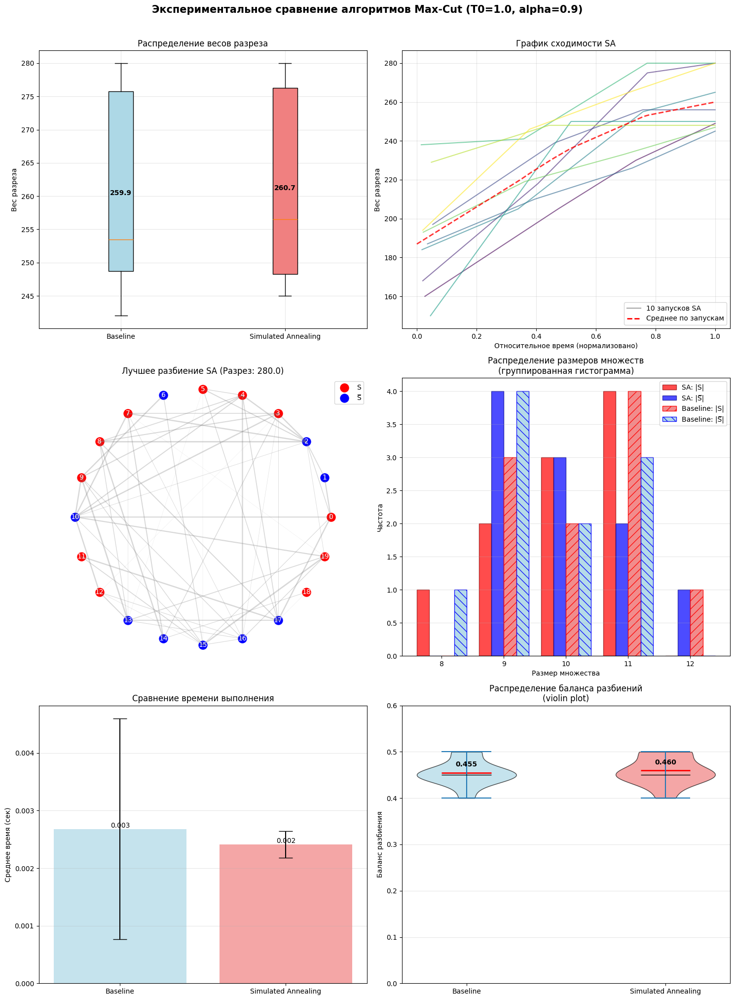

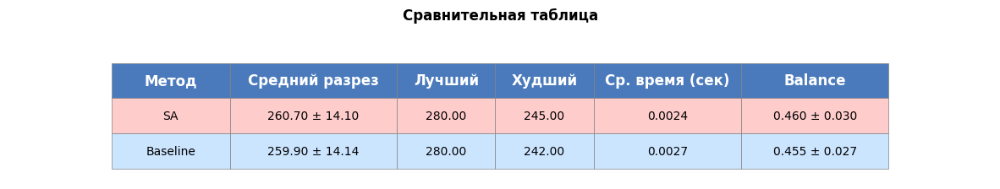

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 1.0
  Коэффициент охлаждения α = 0.93


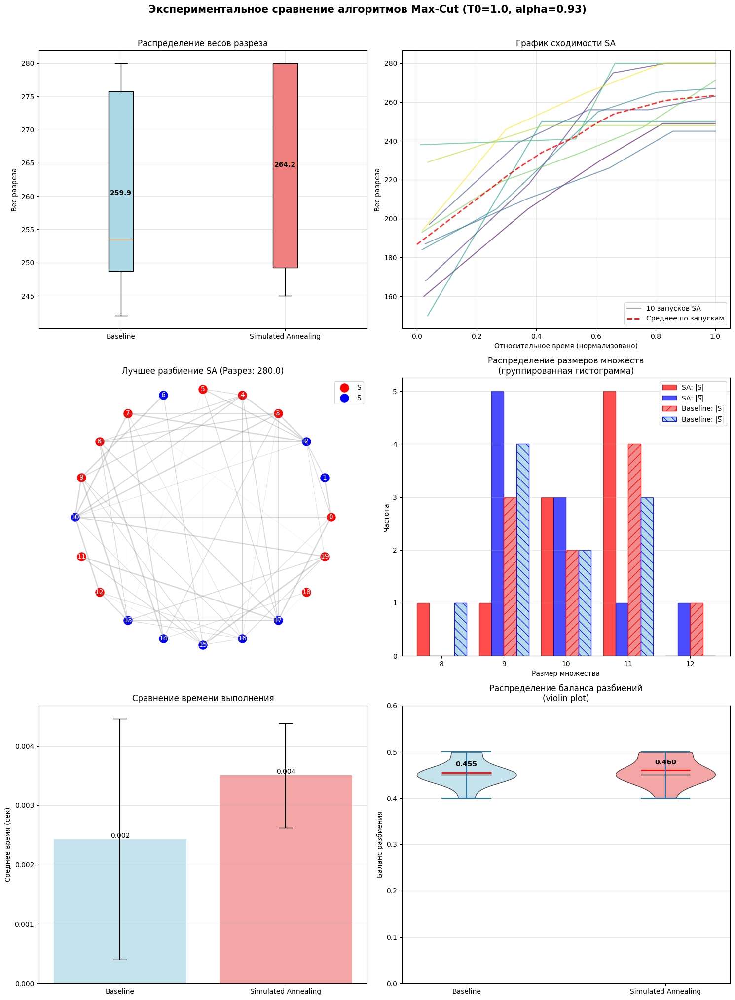

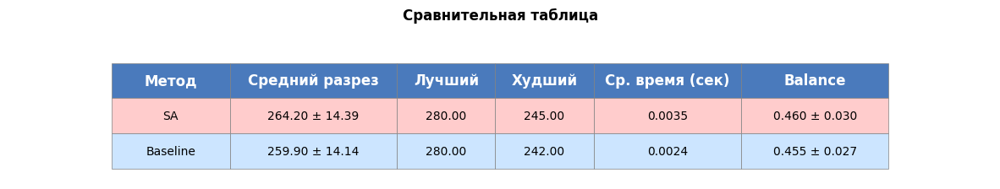

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 1.0
  Коэффициент охлаждения α = 0.96


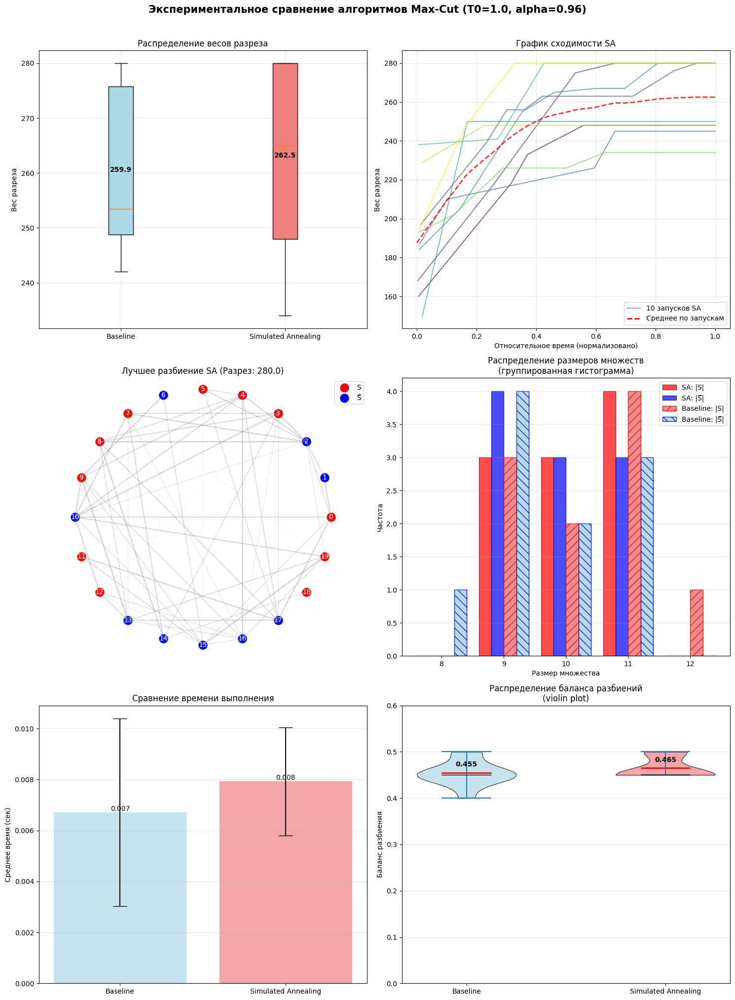

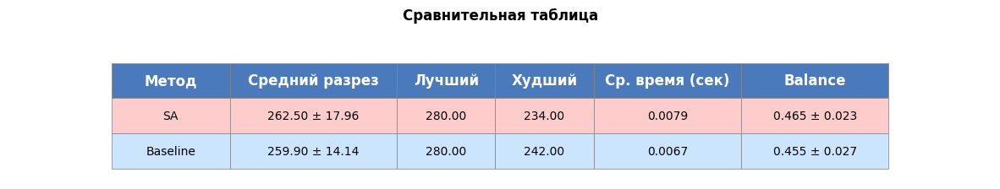

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 1.0
  Коэффициент охлаждения α = 0.99


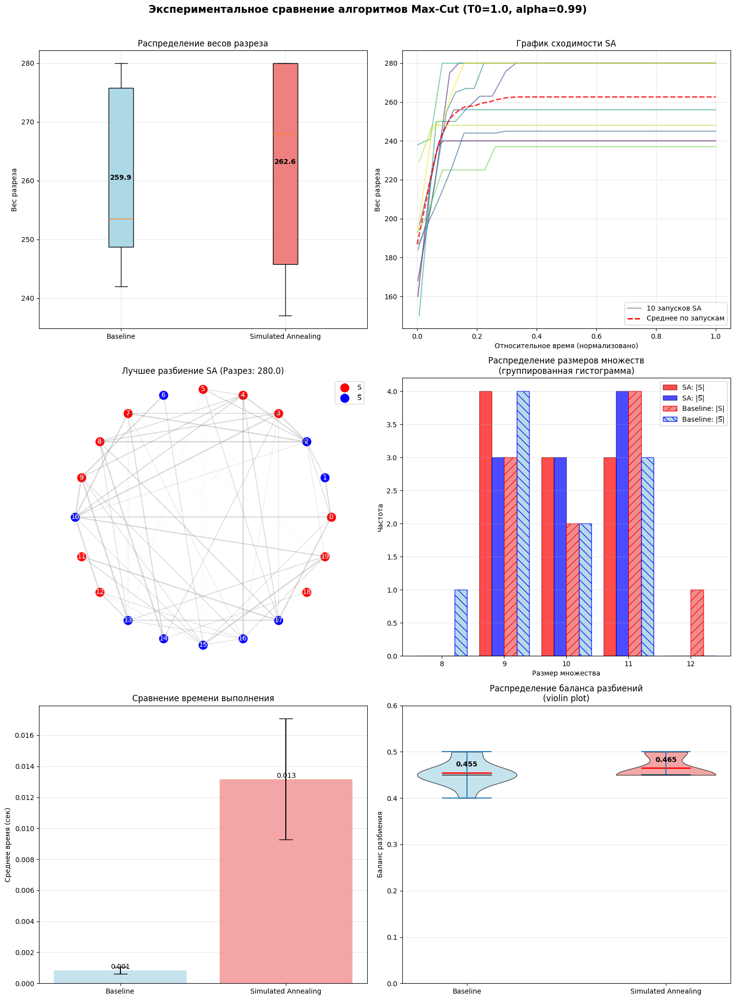

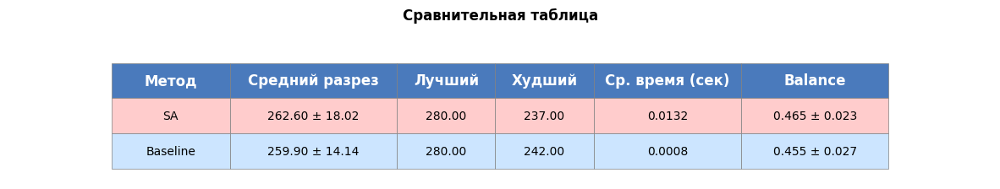

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 1.5
  Коэффициент охлаждения α = 0.9


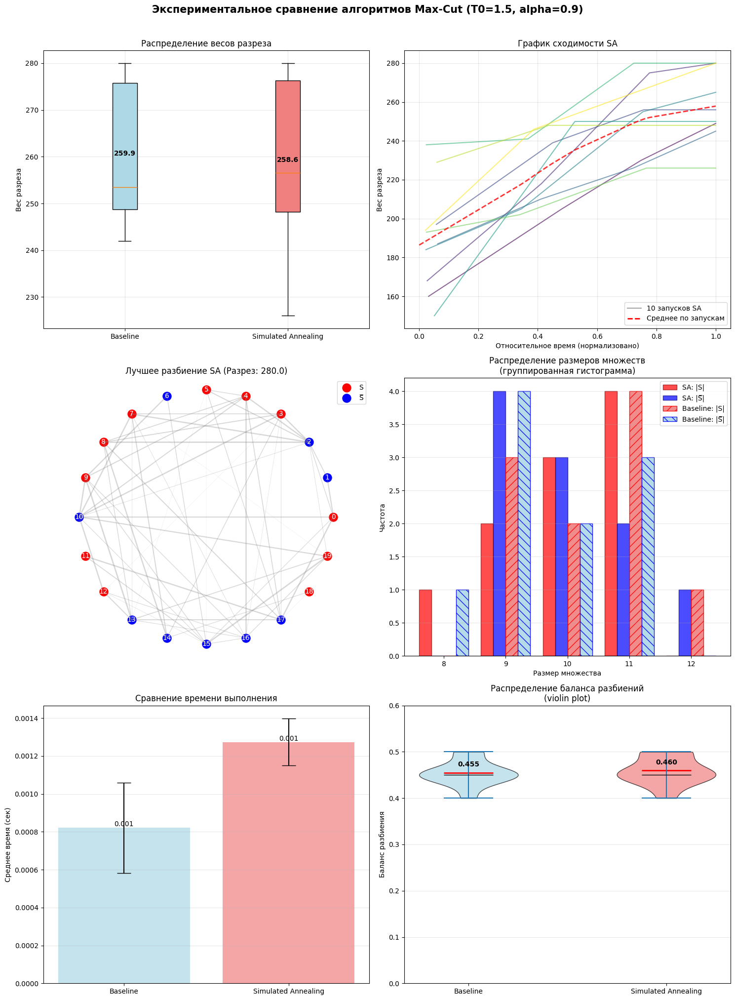

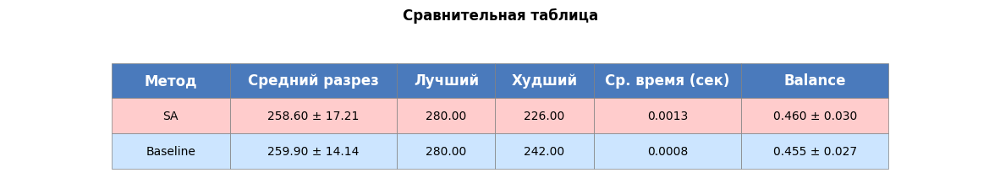

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 1.5
  Коэффициент охлаждения α = 0.93


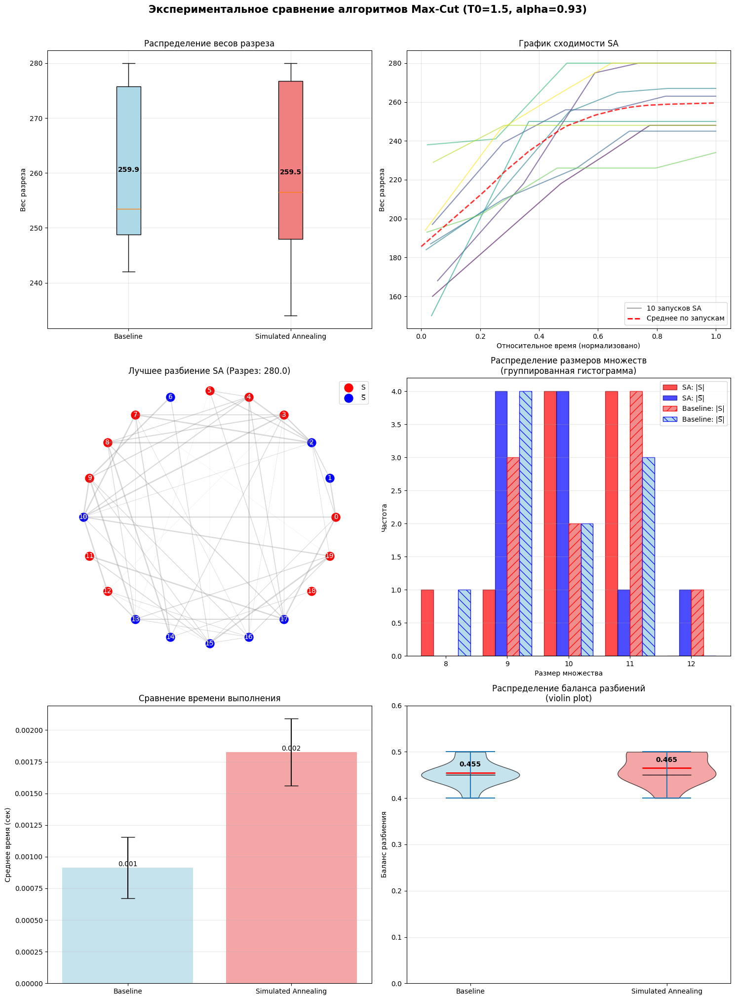

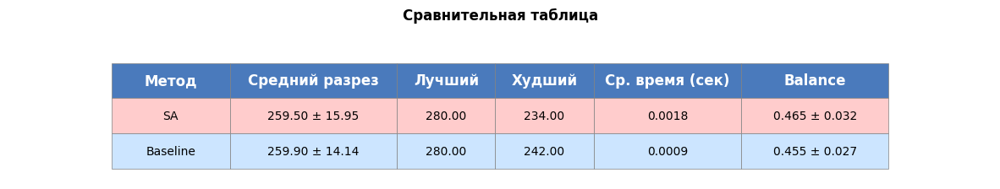

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 1.5
  Коэффициент охлаждения α = 0.96


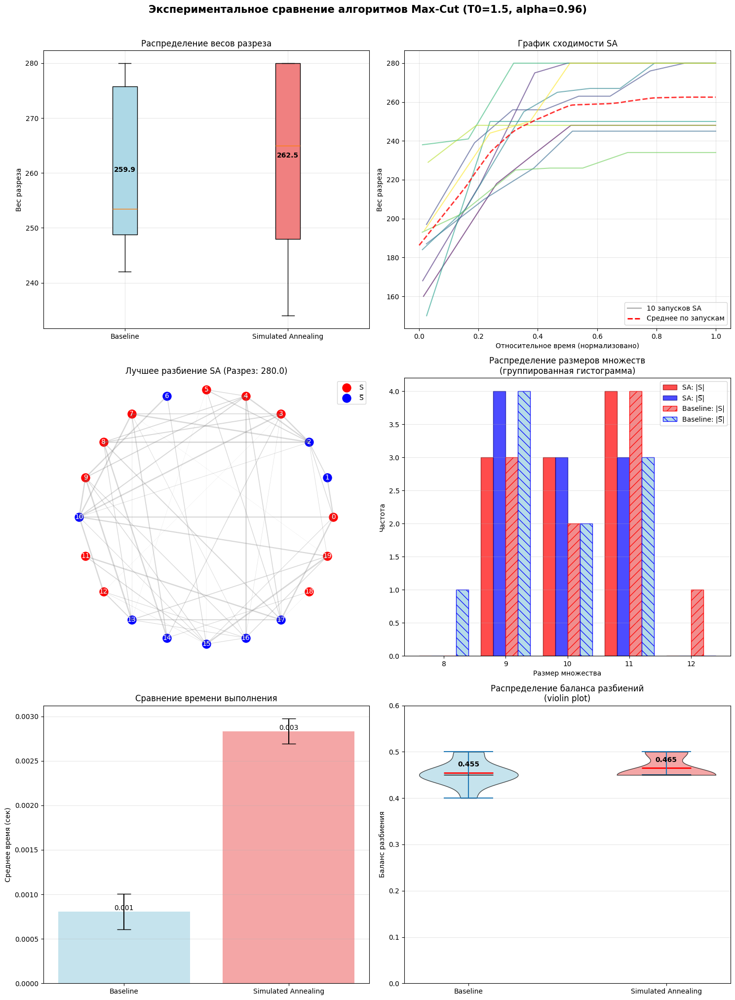

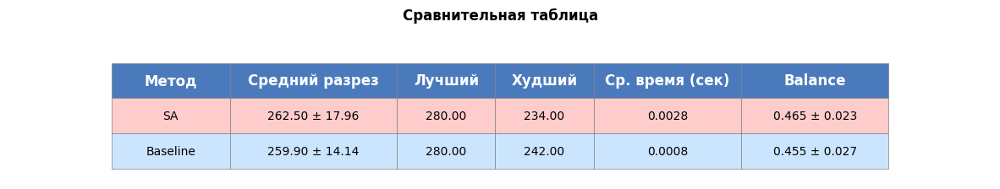

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 1.5
  Коэффициент охлаждения α = 0.99


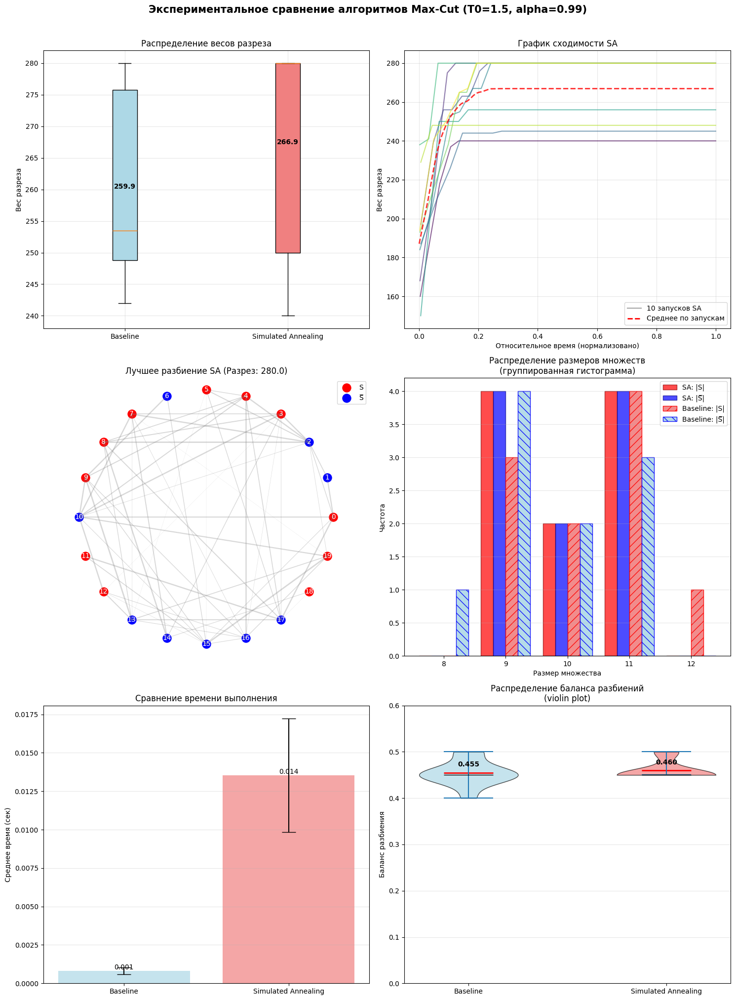

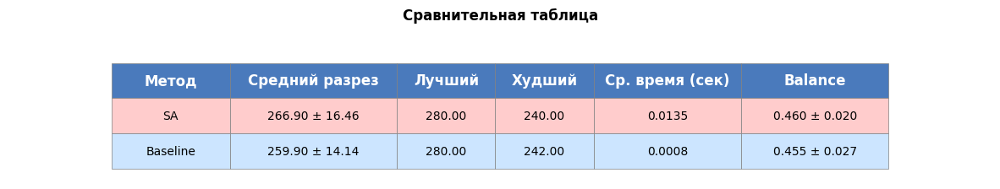

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 2.0
  Коэффициент охлаждения α = 0.9


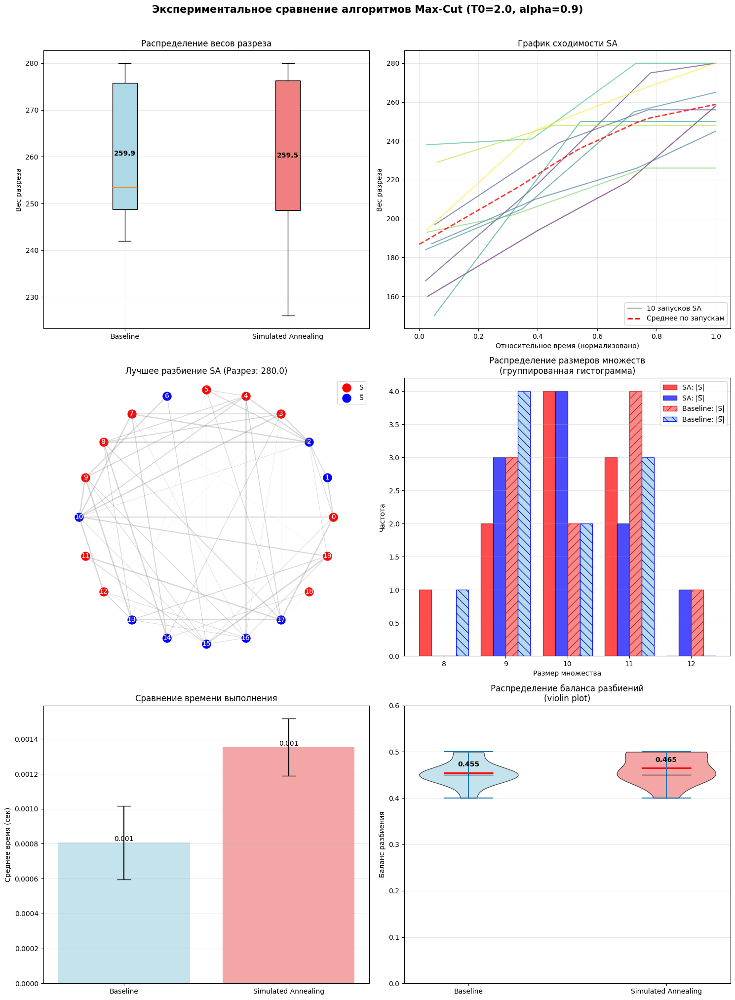

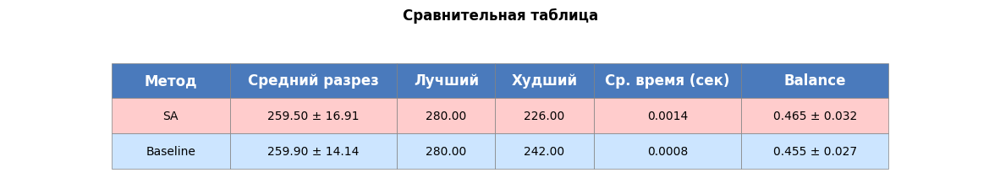

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 2.0
  Коэффициент охлаждения α = 0.93


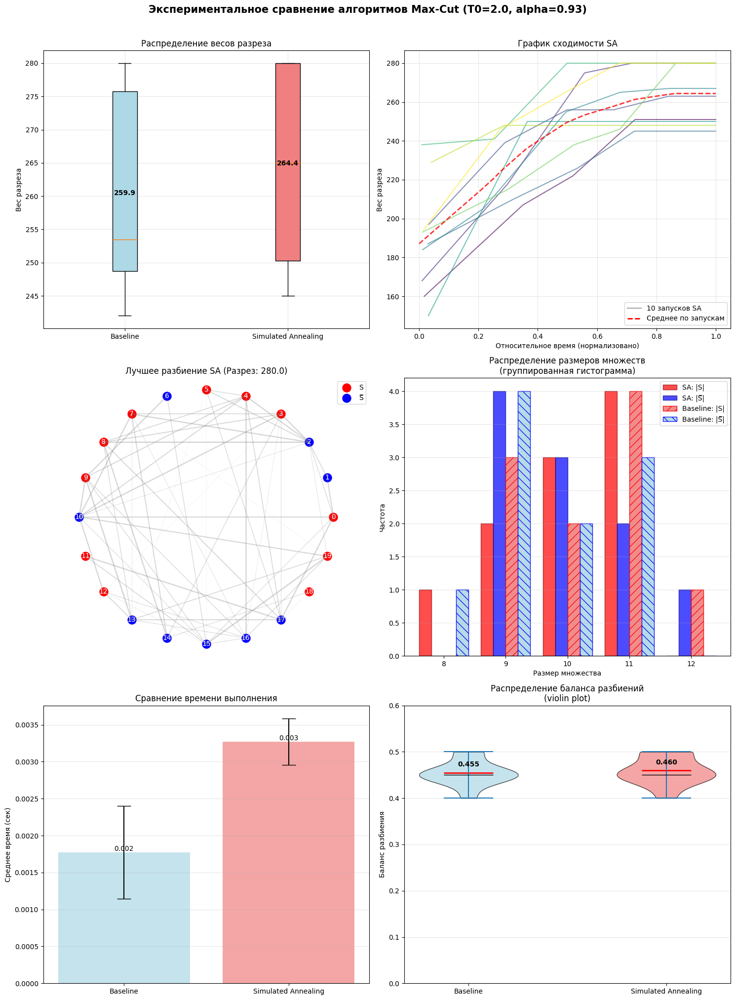

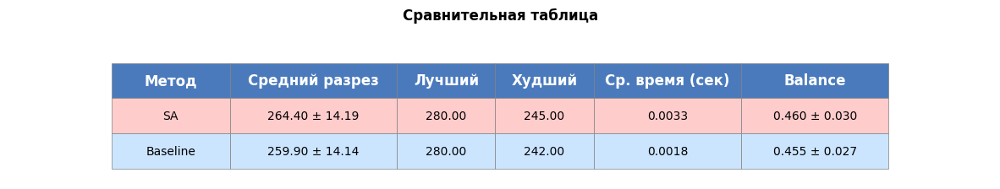

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 2.0
  Коэффициент охлаждения α = 0.96


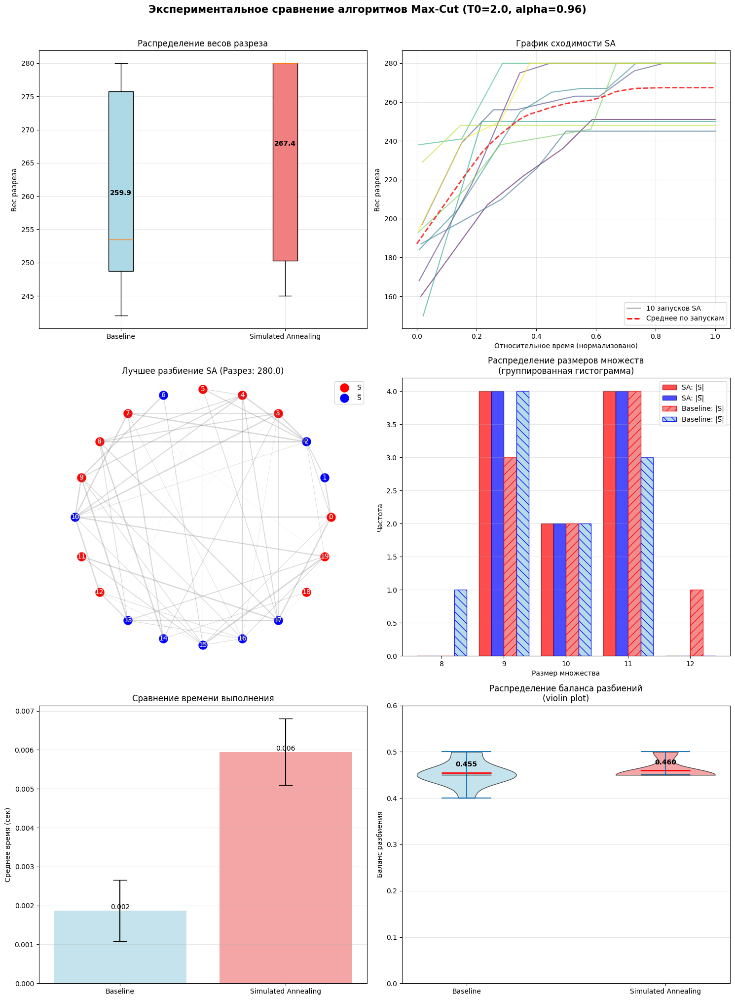

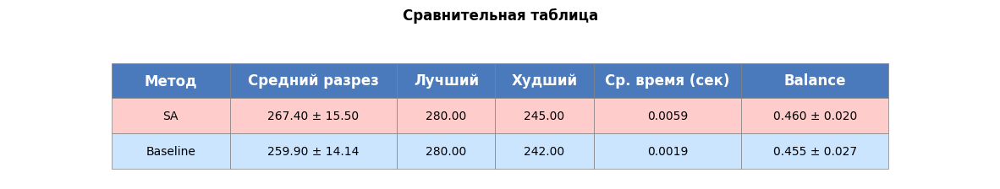

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 2.0
  Коэффициент охлаждения α = 0.99


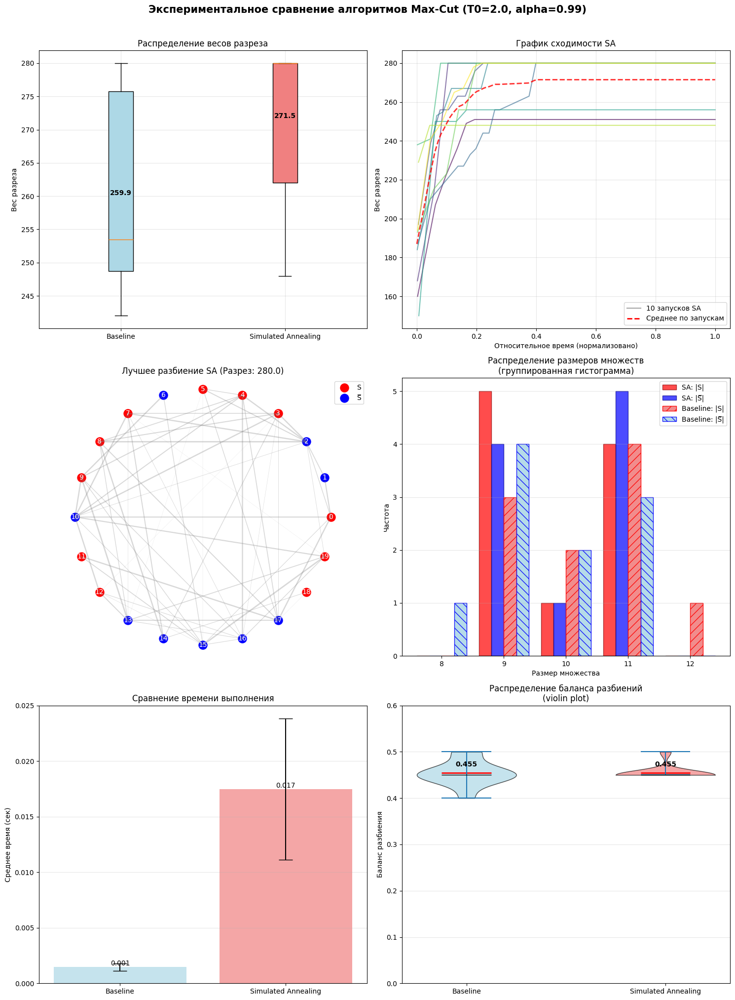

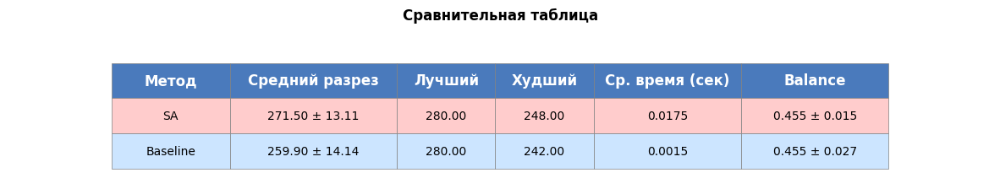

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 2.5
  Коэффициент охлаждения α = 0.9


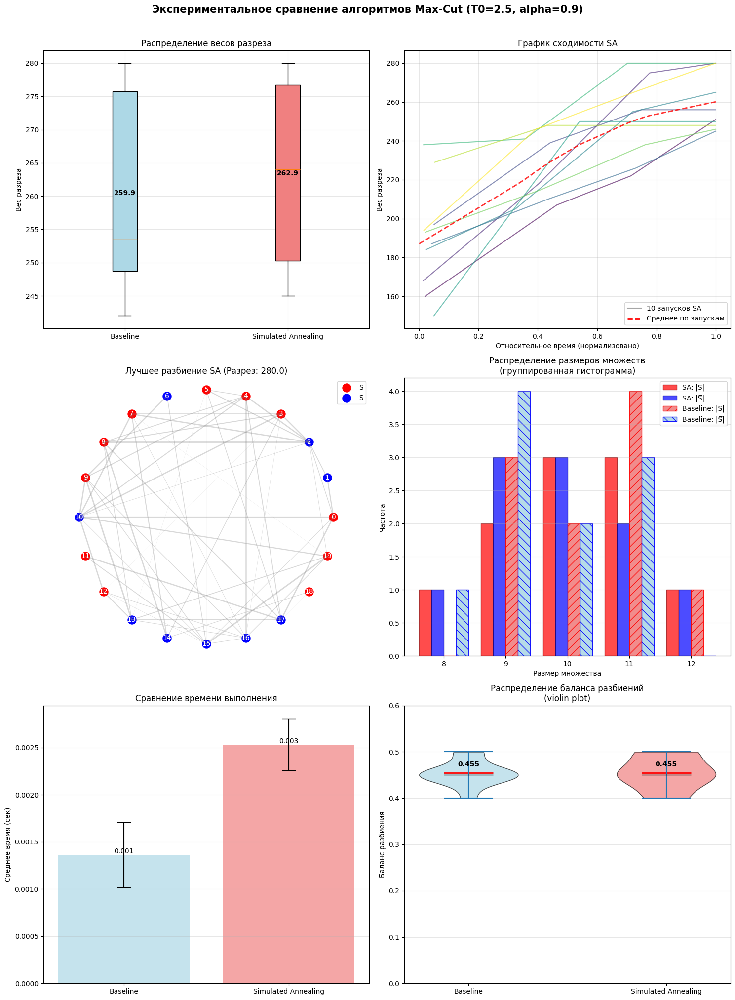

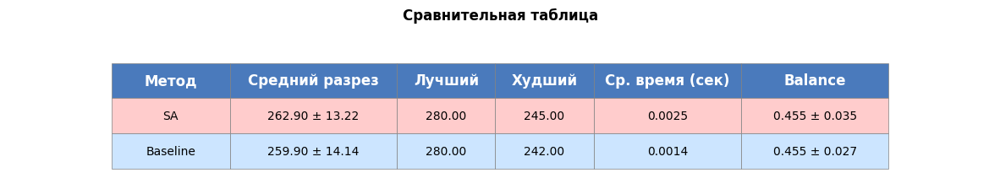

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 2.5
  Коэффициент охлаждения α = 0.93


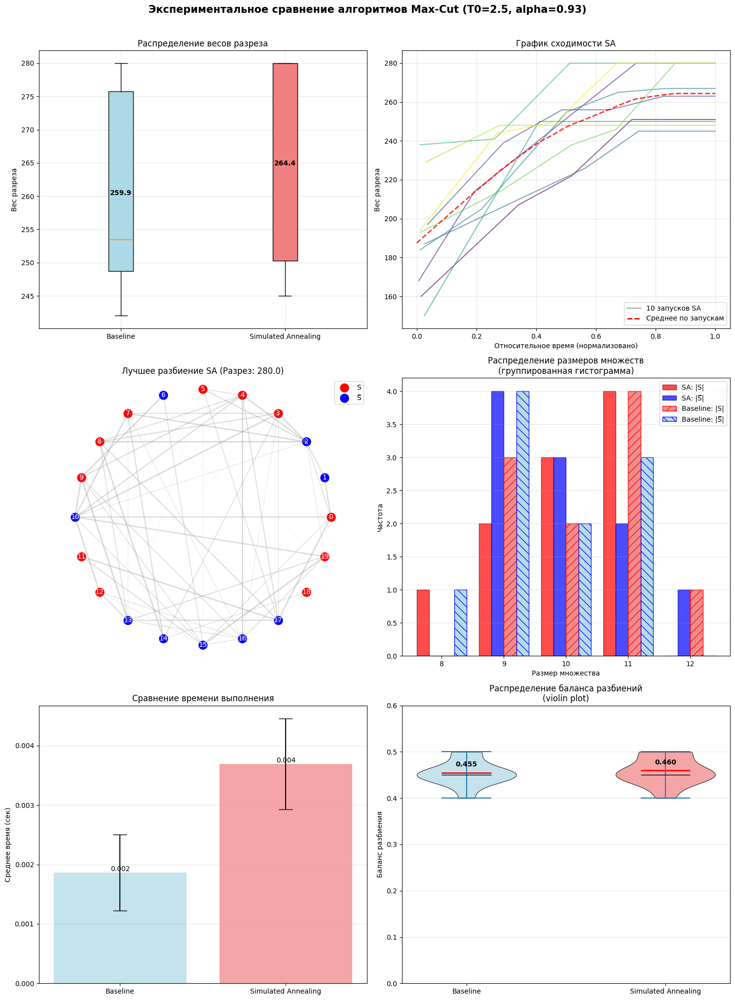

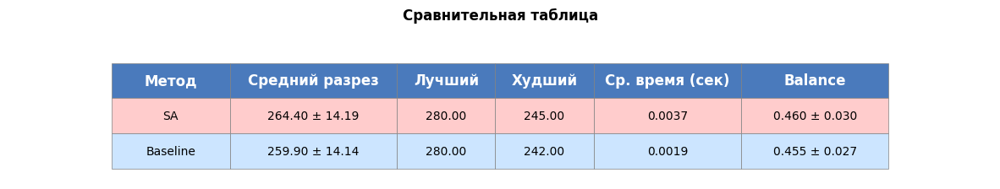

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 2.5
  Коэффициент охлаждения α = 0.96


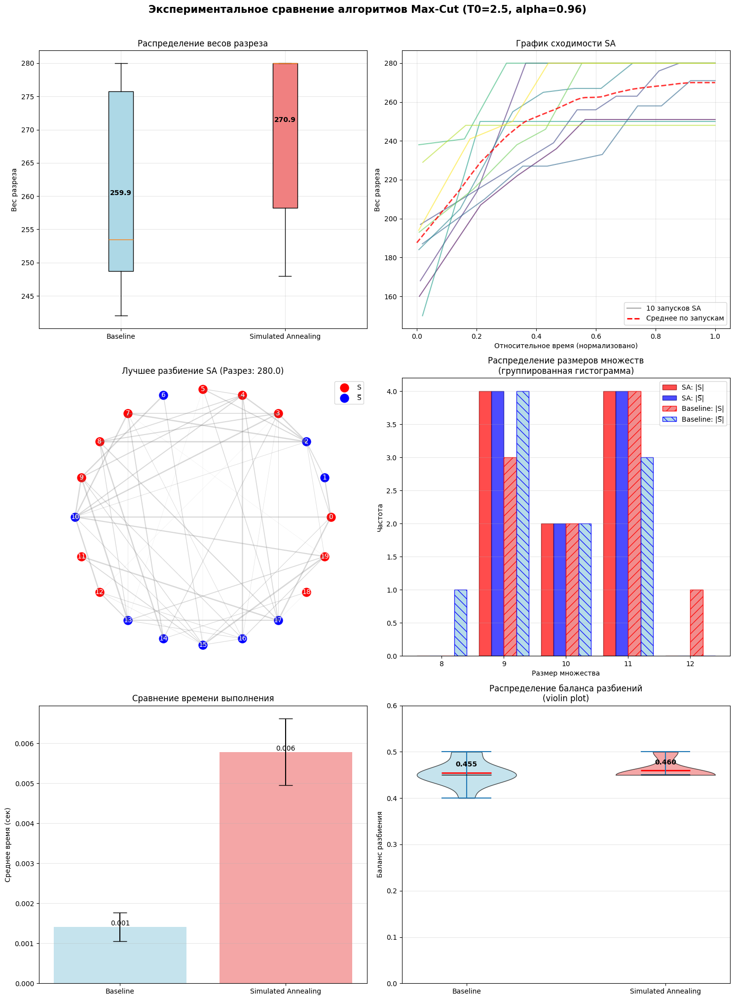

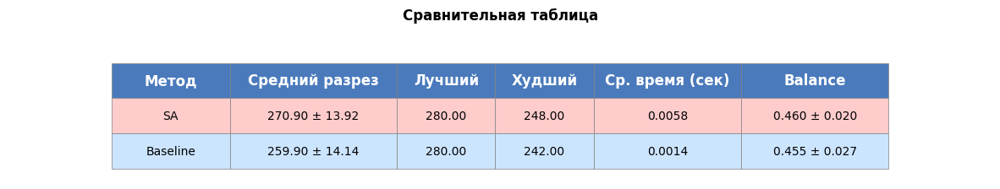

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 2.5
  Коэффициент охлаждения α = 0.99


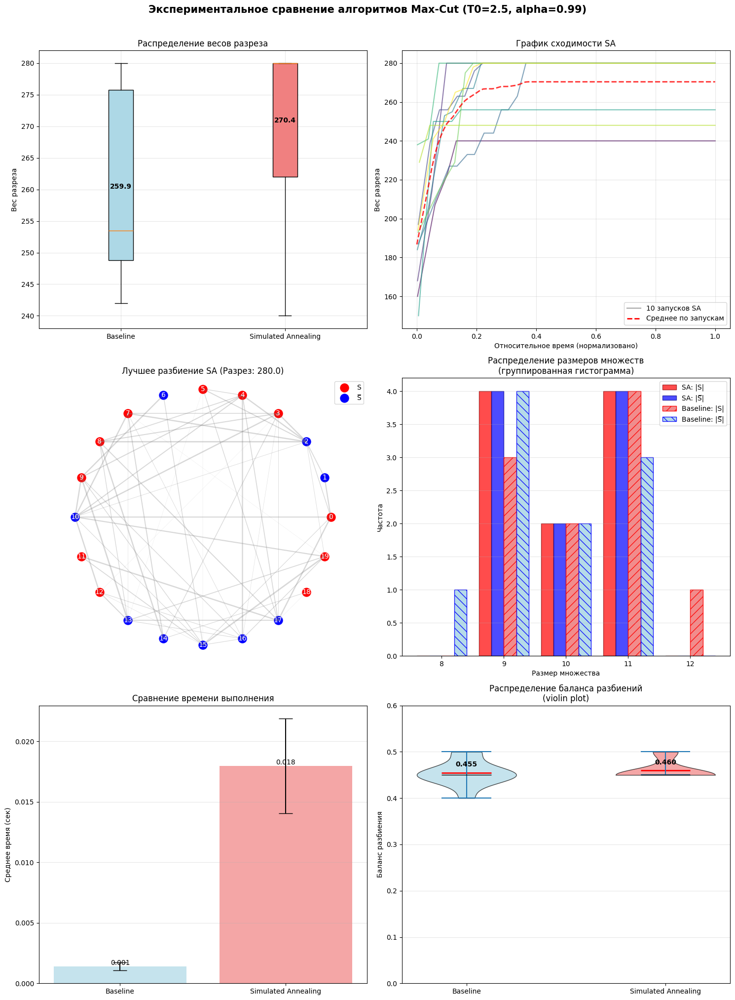

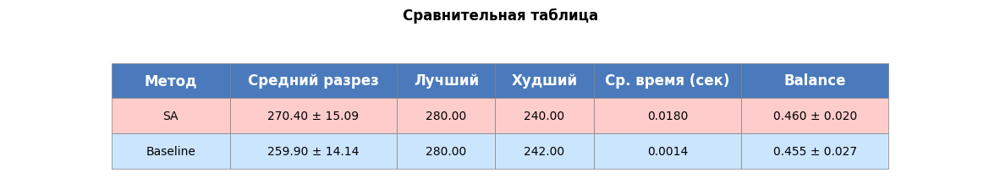

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 3.0
  Коэффициент охлаждения α = 0.9


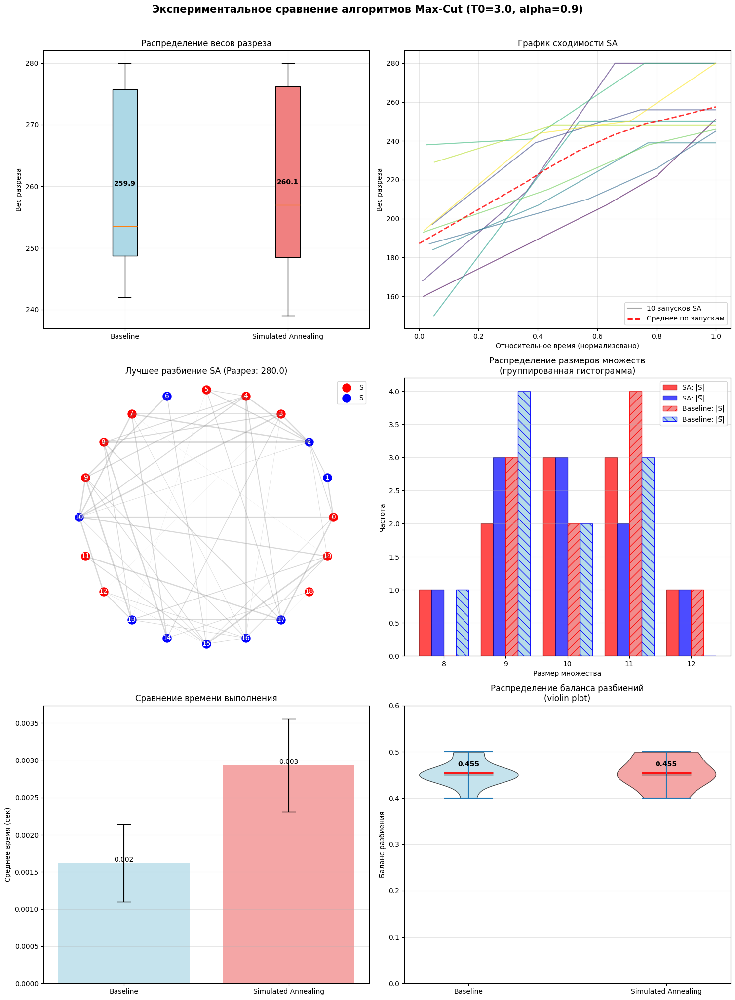

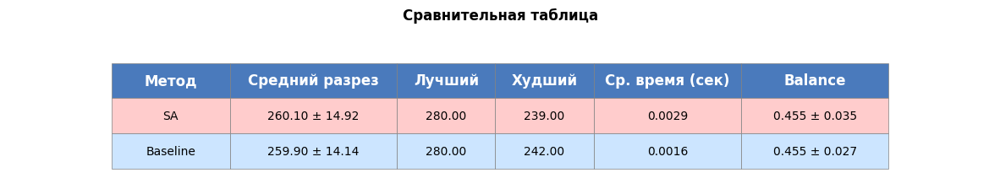

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 3.0
  Коэффициент охлаждения α = 0.93


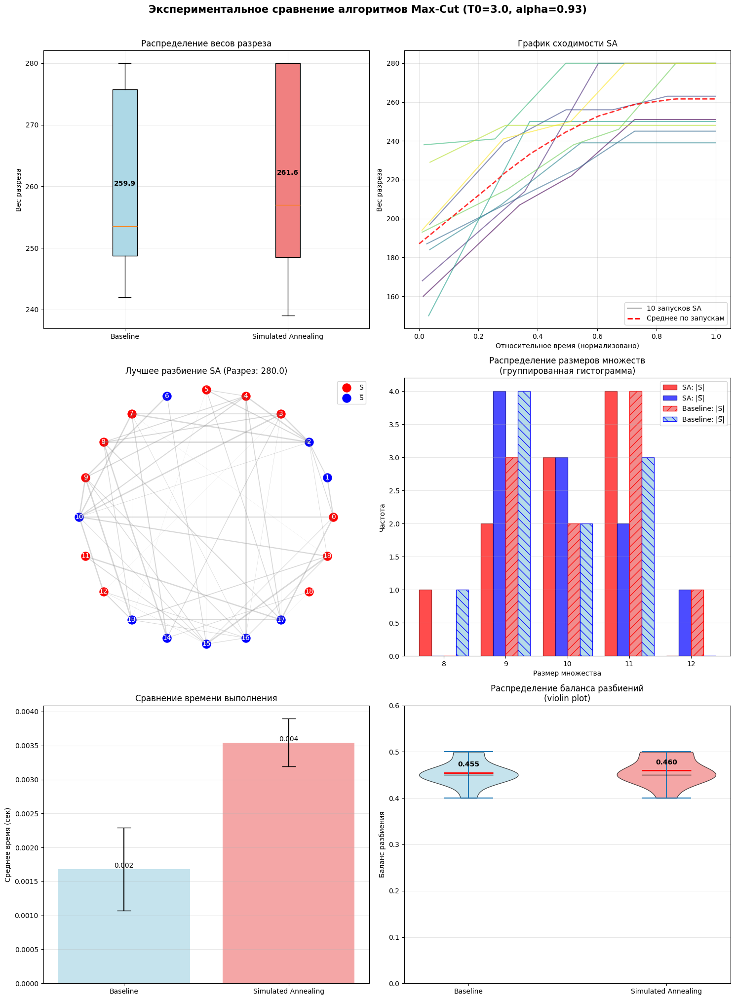

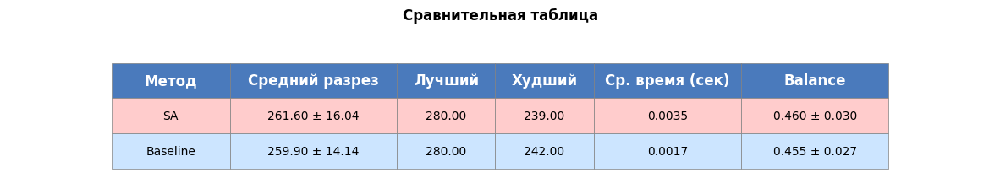

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 3.0
  Коэффициент охлаждения α = 0.96


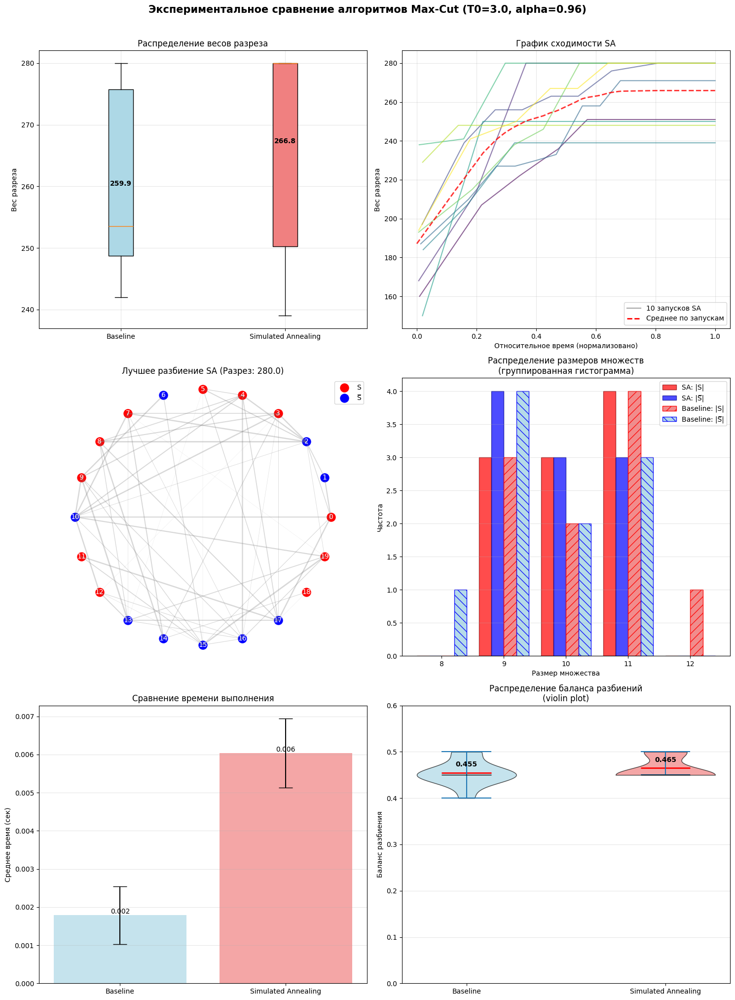

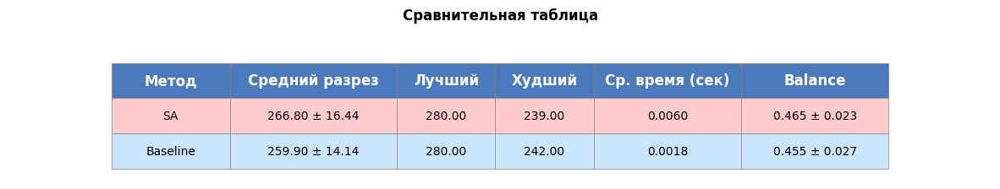

ЭКСПЕРИМЕНТАЛЬНОЕ СРАВНЕНИЕ АЛГОРИТМОВ ДЛЯ MAX-CUT
  Начальная температура T0 = 3.0
  Коэффициент охлаждения α = 0.99


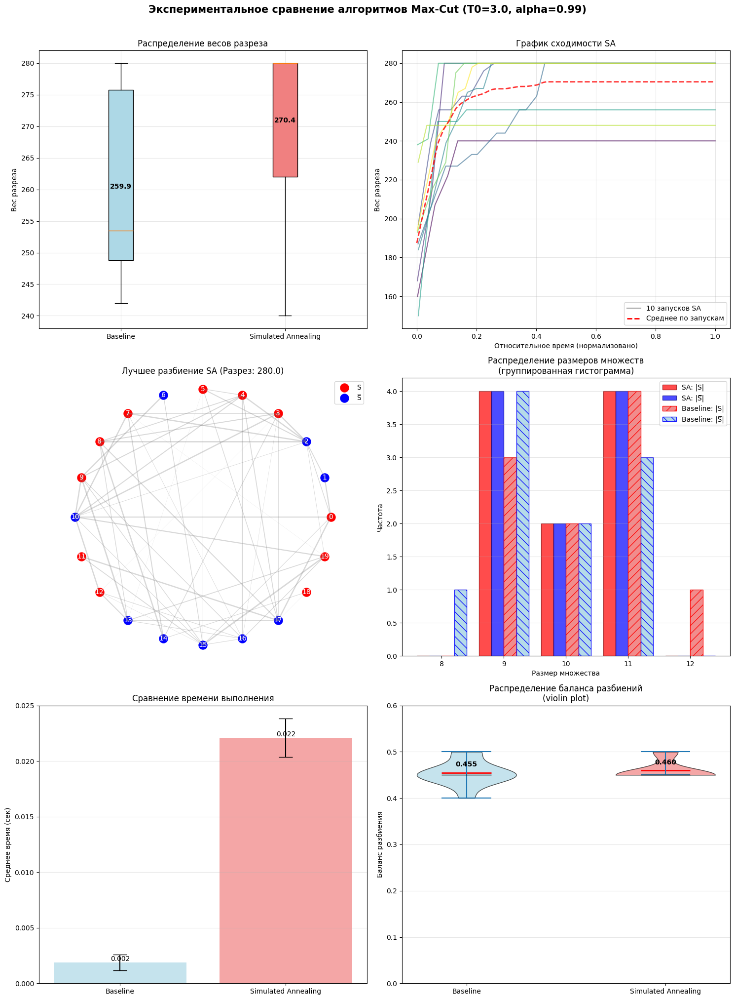

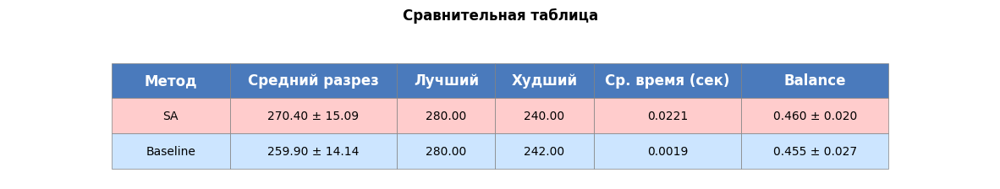

In [10]:
list_sa_results = selection_of_experiments_parameters()

In [11]:
# ====================
# ВИЗУАЛИЗАЦИЯ ЗАВИСИМОСТИ КАЧЕСТВА ОТ ПАРАМЕТРОВ
# ====================
def visualize_parameter_dependence(list_sa_results: List[Dict]):
    """
    Визуализирует зависимость качества решения от параметров T0 и α
    list_sa_results: список словарей с ключами 'T0', 'alpha', 'sa_results'
    """

    # 1. Извлекаем уникальные значения параметров
    T0_values = sorted(list(set(result['T0'] for result in list_sa_results)))
    alpha_values = sorted(list(set(result['alpha'] for result in list_sa_results)))

    # 2. Создаем матрицы для средних, лучших значений и времени
    mean_cuts = np.zeros((len(alpha_values), len(T0_values)))
    best_cuts = np.zeros((len(alpha_values), len(T0_values)))
    mean_times_to_best = np.zeros((len(alpha_values), len(T0_values)))

    # 3. Заполняем матрицы данными
    for result in list_sa_results:
        T0 = result['T0']
        alpha = result['alpha']
        sa_results = result['sa_results']

        # Находим индексы в матрицах
        i = alpha_values.index(alpha)
        j = T0_values.index(T0)

        # Извлекаем значения разрезов из результатов SA
        cuts = [r['cut_value'] for r in sa_results]

        # Извлекаем значения времени достижения лучшего результата
        times_to_best = []
        for r in sa_results:
            if 'time_to_best' in r:
                times_to_best.append(r['time_to_best'])
            else:
                # Если поле отсутствует, используем общее время
                times_to_best.append(r.get('time', 0))

        # Заполняем матрицы
        mean_cuts[i, j] = np.mean(cuts) if cuts else 0
        best_cuts[i, j] = np.max(cuts) if cuts else 0
        mean_times_to_best[i, j] = np.mean(times_to_best) if times_to_best else 0

    # Создаем фигуру с несколькими графиками
    fig = plt.figure(figsize=(16, 12))

    # 1. ТЕПЛОВАЯ КАРТА (HEATMAP) - средние значения разреза
    ax1 = plt.subplot(2, 3, 1)
    sns.heatmap(mean_cuts,
                annot=True,
                fmt=".1f",
                xticklabels=T0_values,
                yticklabels=alpha_values,
                cmap="YlOrRd",
                cbar_kws={'label': 'Средний вес разреза'})
    ax1.set_xlabel('Начальная температура T0')
    ax1.set_ylabel('Коэффициент охлаждения α')
    ax1.set_title('Тепловая карта: средний вес разреза')

    # 2. ТЕПЛОВАЯ КАРТА - среднее время достижения лучшего значения
    ax2 = plt.subplot(2, 3, 2)
    # Используем инвертированную палитру: меньше время = лучше
    sns.heatmap(mean_times_to_best,
                annot=True,
                fmt=".4f",  # Формат для времени (3 знака после запятой)
                xticklabels=T0_values,
                yticklabels=alpha_values,
                cmap="YlOrRd",  # "_r" означает reversed (инвертированная палитра)
                cbar_kws={'label': 'Среднее время до лучшего решения (сек)'})
    ax2.set_xlabel('Начальная температура T0')
    ax2.set_ylabel('Коэффициент охлаждения α')
    ax2.set_title('Тепловая карта: среднее время достижения\nлучшего значения')

    # 3. 3D ПОВЕРХНОСТЬ
    if len(T0_values) > 1 and len(alpha_values) > 1:  # Только если есть как минимум 2 значения по каждой оси
        ax3 = plt.subplot(2, 3, 3, projection='3d')

        # Создаем сетку для 3D графика
        T0_grid, alpha_grid = np.meshgrid(T0_values, alpha_values)

        # Поверхность
        surf = ax3.plot_surface(T0_grid, alpha_grid, mean_cuts,
                               cmap='viridis', alpha=0.8)

        ax3.set_xlabel('T0')
        ax3.set_ylabel('α')
        ax3.set_zlabel('Средний вес разреза')
        ax3.set_title('3D поверхность: зависимость качества от параметров')

        # Добавляем цветовую шкалу
        fig.colorbar(surf, ax=ax3, shrink=0.5, aspect=5, label='Вес разреза')
    else:
        ax3 = plt.subplot(2, 3, 3)
        ax3.text(0.5, 0.5, '3D график требует минимум 2 значения\nпо каждой оси параметров',
                ha='center', va='center', transform=ax5.transAxes, fontsize=12)
        ax3.axis('off')

    # 4. ЗАВИСИМОСТЬ ОТ T0 (для каждого α) - средний разрез
    ax4 = plt.subplot(2, 3, 4)
    for i, alpha in enumerate(alpha_values):
        ax4.plot(T0_values, mean_cuts[i, :],
                marker='o', linewidth=2, markersize=8,
                label=f'α={alpha}')

    ax4.set_xlabel('Начальная температура T0')
    ax4.set_ylabel('Средний вес разреза')
    ax4.set_title('Зависимость среднего разреза от T0\nдля разных α')
    ax4.legend(loc='best')
    ax4.grid(True, alpha=0.3)

    # 5. ЗАВИСИМОСТЬ ОТ T0 (для каждого α) - среднее время
    ax5 = plt.subplot(2, 3, 5)
    for i, alpha in enumerate(alpha_values):
        ax5.plot(T0_values, mean_times_to_best[i, :],
                marker='o', linewidth=2, markersize=8,
                label=f'α={alpha}')

    ax5.set_xlabel('Начальная температура T0')
    ax5.set_ylabel('Среднее время до лучшего решения (сек)')
    ax5.set_title('Зависимость времени от T0 для разных α')
    ax5.legend(loc='best')
    ax5.grid(True, alpha=0.3)

    # 6. ЛУЧШАЯ КОНФИГУРАЦИЯ И СРАВНЕНИЕ
    ax6 = plt.subplot(2, 3, 6)
    ax6.axis('off')

    # Находим лучшую конфигурацию по среднему значению разреза
    best_mean_idx = np.unravel_index(np.argmax(mean_cuts), mean_cuts.shape)
    best_alpha_mean = alpha_values[best_mean_idx[0]]
    best_T0_mean = T0_values[best_mean_idx[1]]
    best_mean_value = mean_cuts[best_mean_idx]
    best_mean_time = mean_times_to_best[best_mean_idx]

    # Находим конфигурацию с лучшим единичным результатом
    best_single_idx = np.unravel_index(np.argmax(best_cuts), best_cuts.shape)
    best_alpha_single = alpha_values[best_single_idx[0]]
    best_T0_single = T0_values[best_single_idx[1]]
    best_single_value = best_cuts[best_single_idx]
    best_single_time = mean_times_to_best[best_single_idx]

    # Находим конфигурацию с наименьшим временем достижения хорошего результата
    # (найдем конфигурацию с максимальным разрезом среди тех, где время меньше медианы)
    median_time = np.median(mean_times_to_best[mean_times_to_best > 0])
    fast_configs_mask = mean_times_to_best <= median_time

    if np.any(fast_configs_mask):
        fast_mean_cuts = mean_cuts.copy()
        fast_mean_cuts[~fast_configs_mask] = -np.inf  # Исключаем медленные конфигурации
        best_fast_idx = np.unravel_index(np.argmax(fast_mean_cuts), fast_mean_cuts.shape)
        best_alpha_fast = alpha_values[best_fast_idx[0]]
        best_T0_fast = T0_values[best_fast_idx[1]]
        best_fast_value = mean_cuts[best_fast_idx]
        best_fast_time = mean_times_to_best[best_fast_idx]
    else:
        best_alpha_fast = "N/A"
        best_T0_fast = "N/A"
        best_fast_value = 0
        best_fast_time = 0

    # Текстовая информация
    info_text = (
        "АНАЛИЗ ЛУЧШИХ ПАРАМЕТРОВ\n"
        "=======================\n\n"
        f"Лучшая средняя производительность:\n"
        f"  T0 = {best_T0_mean}, α = {best_alpha_mean}\n"
        f"  Средний разрез: {best_mean_value:.2f}\n"
        f"  Среднее время: {best_mean_time:.3f} сек\n\n"

        f"Лучший единичный результат:\n"
        f"  T0 = {best_T0_single}, α = {best_alpha_single}\n"
        f"  Лучший разрез: {best_single_value:.2f}\n"
        f"  Среднее время: {best_single_time:.3f} сек\n\n"

        f"Лучший баланс скорость/качество:\n"
        f"  T0 = {best_T0_fast}, α = {best_alpha_fast}\n"
        f"  Средний разрез: {best_fast_value:.2f}\n"
        f"  Среднее время: {best_fast_time:.3f} сек\n\n"

        f"Рекомендации:\n"
    )

    # Анализ трендов
    if best_alpha_mean >= 0.96:
        info_text += "  • Высокие α (>0.96) дают лучшие результаты\n"
    else:
        info_text += "  • Средние α (0.93-0.96) дают лучшие результаты\n"

    if best_T0_mean >= 2.0:
        info_text += "  • Высокие T0 (>2.0) работают лучше\n"
    else:
        info_text += "  • Низкие T0 (<2.0) работают лучше\n"

    ax6.text(0.05, 0.95, info_text,
            transform=ax6.transAxes,
            fontsize=11,
            verticalalignment='top',
            bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.8))

    plt.suptitle('Анализ зависимости качества решения от параметров имитации отжига',
                fontsize=16, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

    # Возвращаем дополнительные данные для анализа
    return {
        'T0_values': T0_values,
        'alpha_values': alpha_values,
        'mean_cuts': mean_cuts,
        'best_cuts': best_cuts,
        'mean_times_to_best': mean_times_to_best,
        'best_config_mean': {
            'T0': best_T0_mean,
            'alpha': best_alpha_mean,
            'cut': best_mean_value,
            'time': best_mean_time
        },
        'best_config_single': {
            'T0': best_T0_single,
            'alpha': best_alpha_single,
            'cut': best_single_value,
            'time': best_single_time
        },
        'best_config_fast': {
            'T0': best_T0_fast,
            'alpha': best_alpha_fast,
            'cut': best_fast_value,
            'time': best_fast_time
        }
    }

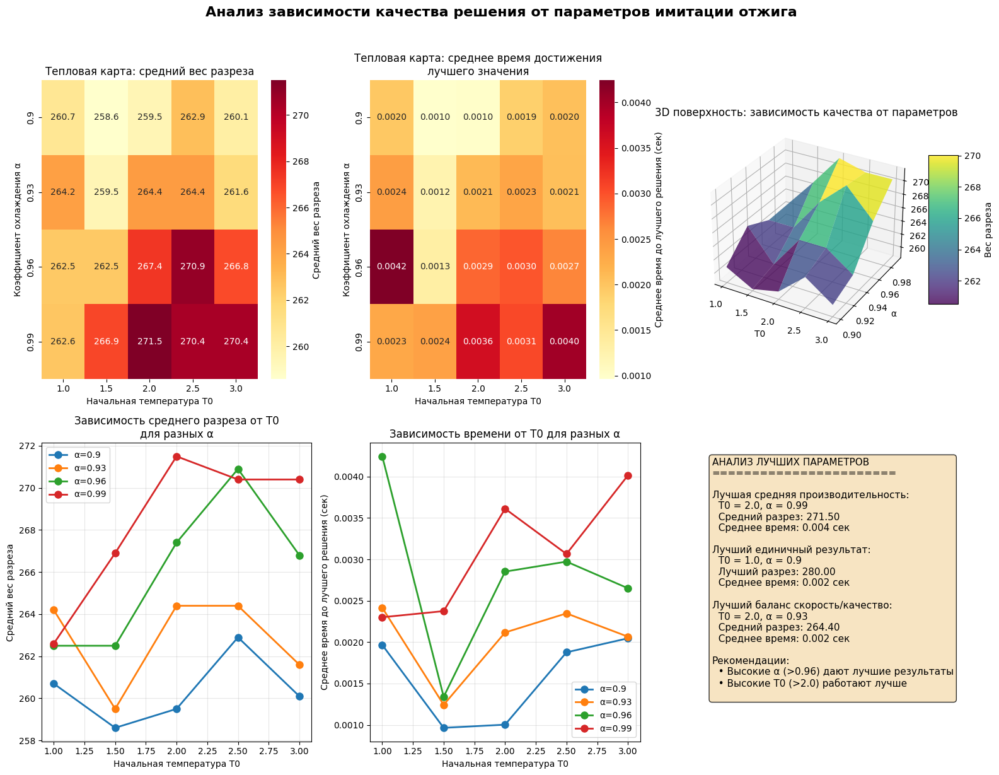

{'T0_values': [1.0, 1.5, 2.0, 2.5, 3.0],
 'alpha_values': [0.9, 0.93, 0.96, 0.99],
 'mean_cuts': array([[260.7, 258.6, 259.5, 262.9, 260.1],
        [264.2, 259.5, 264.4, 264.4, 261.6],
        [262.5, 262.5, 267.4, 270.9, 266.8],
        [262.6, 266.9, 271.5, 270.4, 270.4]]),
 'best_cuts': array([[280., 280., 280., 280., 280.],
        [280., 280., 280., 280., 280.],
        [280., 280., 280., 280., 280.],
        [280., 280., 280., 280., 280.]]),
 'mean_times_to_best': array([[0.00196633, 0.00096476, 0.00100303, 0.00187685, 0.00204628],
        [0.00241597, 0.001243  , 0.00211656, 0.00234718, 0.00206623],
        [0.00424447, 0.00133963, 0.00285177, 0.00297277, 0.00265119],
        [0.00230081, 0.00237472, 0.00361156, 0.00306499, 0.00401404]]),
 'best_config_mean': {'T0': 2.0,
  'alpha': 0.99,
  'cut': np.float64(271.5),
  'time': np.float64(0.0036115646362304688)},
 'best_config_single': {'T0': 1.0,
  'alpha': 0.9,
  'cut': np.float64(280.0),
  'time': np.float64(0.00196633338928222

In [12]:
visualize_parameter_dependence(list_sa_results)